# LAKAVATH RAGHURAM
# 2022BCS0129

# Build Image Caption Generator with CNN & LSTM.

In [ ]:
#!pip install kaggle==1.6.17 --force
!mkdir -p ~/.kaggle
!echo '{"username":"lakavath*****ram","key":"e8b0vb5v84ed65***********896582d5adb"}' > ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

In [2]:
!kaggle datasets download -d adityajn105/flickr8k -p /content/flickr8k --unzip


Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0
 96% 0.99G/1.04G [00:10<00:00, 67.0MB/s]
100% 1.04G/1.04G [00:13<00:00, 81.9MB/s]


#Import the required libraries

In [13]:
import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, add
from tensorflow.keras.layers import Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from sklearn.model_selection import train_test_split
from PIL import Image
from tqdm import tqdm_notebook
from collections import Counter
import random  # for dataset shuffling and subsetting


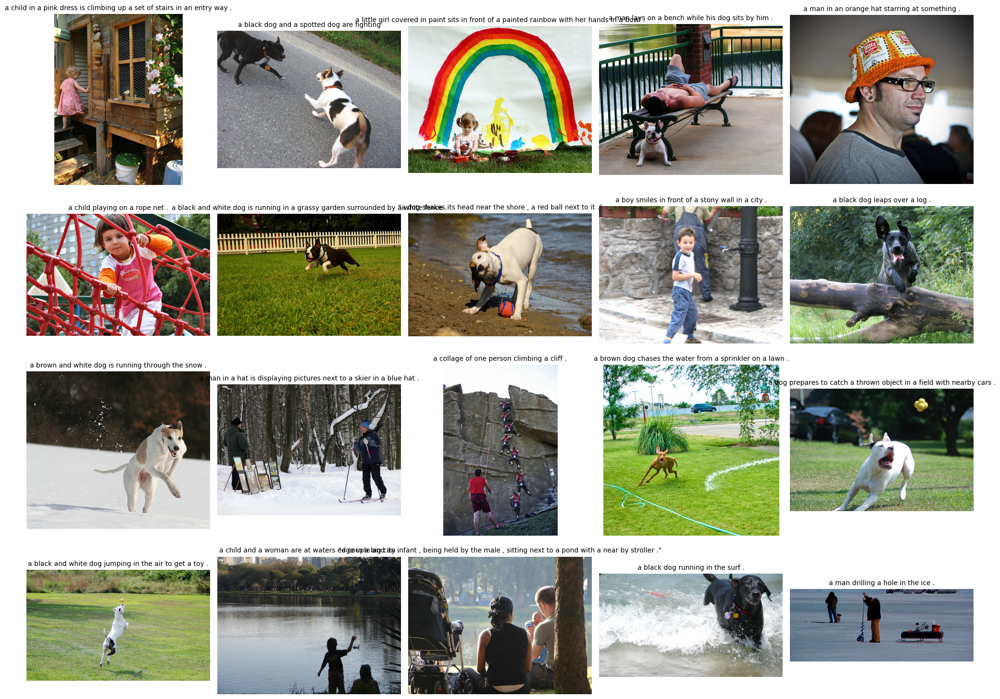

In [3]:
import os
import matplotlib.pyplot as plt
from PIL import Image

images_directory = '/content/flickr8k/Images/'
captions_path = '/content/flickr8k/captions.txt'


# Load captions into a dictionary
def load_captions(file_path):
    caption_dict = {}
    with open(file_path, 'r') as f:
        data = f.readlines()[1:]  # skip header
        for line in data:
            line = line.strip().lower()
            if line:
                img_name, caption = line.split(",", 1)
                img_name = img_name.strip()
                caption = caption.strip()

                if img_name not in caption_dict:
                    caption_dict[img_name] = []
                caption_dict[img_name].append(caption)
    return caption_dict


captions_dict = load_captions(captions_path)

# Pick 20 images
image_list = list(captions_dict.keys())[:20]   # first 20 images


# Plot 4×5 grid
plt.figure(figsize=(20, 15))

for idx, img_name in enumerate(image_list):
    img_path = os.path.join(images_directory, img_name)
    img = Image.open(img_path)

    plt.subplot(4, 5, idx + 1)
    plt.imshow(img)
    plt.axis('off')

    # show first caption under each image
    caption = captions_dict[img_name][0]
    plt.title(caption, fontsize=10)

plt.tight_layout()
plt.show()


In [15]:
# Image and captions file paths
images_directory = '/content/flickr8k/Images/'
captions_path = '/content/flickr8k/captions.txt'

# Function to load all captions
def load_captions(file_path):
    with open(file_path, 'r') as f:
        captions = f.readlines()
    captions = [caption.lower() for caption in captions[1:]]  # Skip header, make all lowercase
    return captions

def tokenize_captions(captions):
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(captions)
    return tokenizer

# Load all captions
captions = load_captions(captions_path)

# List all image IDs and select only 50% for RAM savings
all_image_ids = os.listdir(images_directory)
random.shuffle(all_image_ids)
half_dataset_size = len(all_image_ids) // 2
half_image_ids = all_image_ids[:half_dataset_size]
print(f"Using {len(half_image_ids)} images out of {len(all_image_ids)}")

# Filter captions for only selected images (by file name)
half_captions = [caption for caption in captions if caption.split(',')[0] in half_image_ids]

# Preview some sample captions
print(half_captions[:15:3])


Using 4045 images out of 8091
['1001773457_577c3a7d70.jpg,a black dog and a spotted dog are fighting\n', '1001773457_577c3a7d70.jpg,two dogs of different breeds looking at each other on the road .\n', '1002674143_1b742ab4b8.jpg,a little girl is sitting in front of a large painted rainbow .\n', '1002674143_1b742ab4b8.jpg,young girl with pigtails painting outside in the grass .\n', '1007320043_627395c3d8.jpg,a little girl in pink climbs a rope bridge at the park .\n']


Cleaning the text

In [21]:
import re

# Function to clean a single caption
def clean_text(text):
    text = re.sub(r'[^\w\s]', '', text)       # Remove punctuation/special characters
    text = re.sub(r'\d+', '', text)           # Remove digits
    text = re.sub(r'\s+', ' ', text).strip()  # Remove extra whitespace
    return text

# Clean all captions in the half-sized dataset
cleaned_captions = [clean_text(caption.split(',')[1]) for caption in half_captions]

# Preview cleaned captions
for cap in cleaned_captions[:15:2]:
    print(cap)


a black dog and a spotted dog are fighting
a black dog and a white dog with brown spots are staring at each other in the street
two dogs on pavement moving toward each other
a little girl is sitting in front of a large painted rainbow
there is a girl with pigtails sitting in front of a rainbow painting
a child playing on a rope net
a little girl in pink climbs a rope bridge at the park
the small child climbs on a red ropes on a playground


Cleaning the captions

In [22]:
# Add 'start' and 'end' tokens and associate each cleaned caption with its image ID

captions_IDs = []
for i in range(len(cleaned_captions)):
    image_id = half_captions[i].split(',')[0]
    item = image_id + '\t' + 'start ' + cleaned_captions[i] + ' end\n'
    captions_IDs.append(item)

# Preview a few prepared (image, caption) pairs
print(captions_IDs[:20:3])
print("Total caption pairs:", len(captions_IDs))


['1001773457_577c3a7d70.jpg\tstart a black dog and a spotted dog are fighting end\n', '1001773457_577c3a7d70.jpg\tstart two dogs of different breeds looking at each other on the road end\n', '1002674143_1b742ab4b8.jpg\tstart a little girl is sitting in front of a large painted rainbow end\n', '1002674143_1b742ab4b8.jpg\tstart young girl with pigtails painting outside in the grass end\n', '1007320043_627395c3d8.jpg\tstart a little girl in pink climbs a rope bridge at the park end\n', '1009434119_febe49276a.jpg\tstart a black and white dog is running in a grassy garden surrounded by a white fence end\n', '1009434119_febe49276a.jpg\tstart a boston terrier is running on lush green grass in front of a white fence end\n']
Total caption pairs: 20225


Load some images with captions

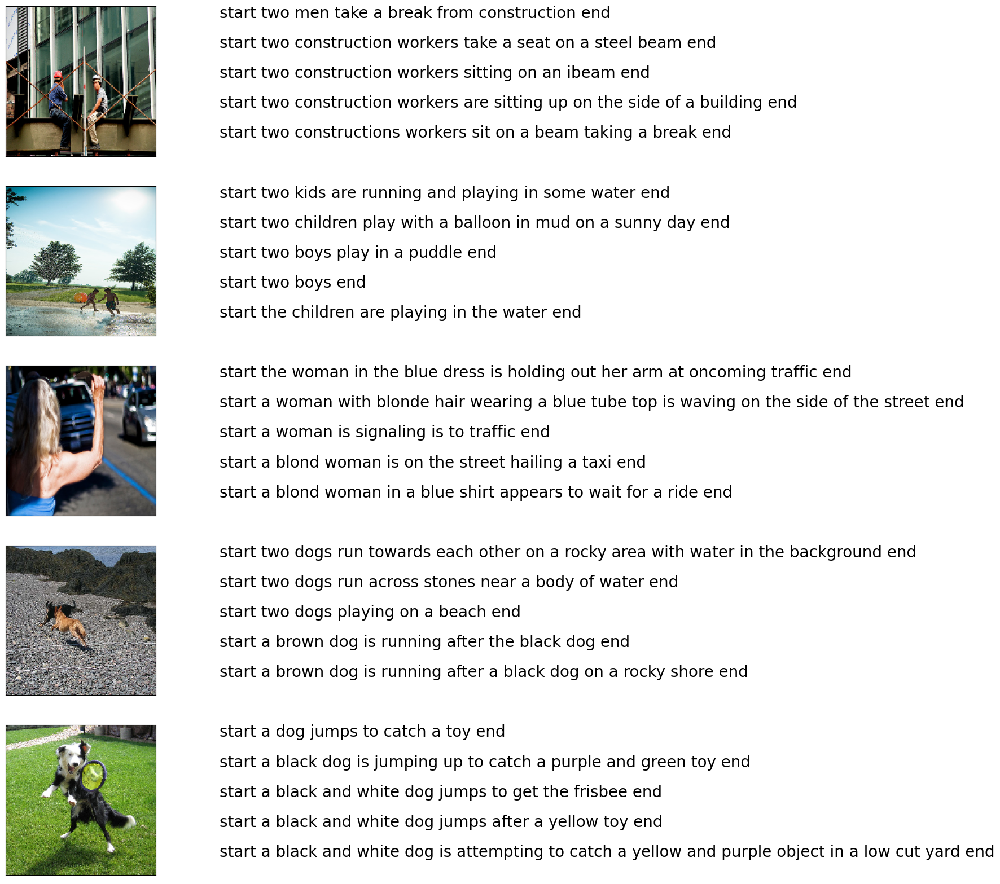

In [23]:
# Visualize a few images and their associated captions

def visualaization(data, num_of_images):
    captions_dictionary = {}
    # Map image file names to caption lists (select only num_of_images * 5 captions for speed)
    for item in data[100:100+(num_of_images)*5]:
        image_id, caption = item.split('\t')
        if image_id not in captions_dictionary:
            captions_dictionary[image_id] = []
        captions_dictionary[image_id].append(caption)
    else:
        list_captions = [x for x in captions_dictionary.items()]

    count = 1
    fig = plt.figure(figsize=(10, 20))
    for filename in list(captions_dictionary.keys()):
        captions = captions_dictionary[filename]
        image_load = load_img(images_directory + filename, target_size=(199, 199, 3))

        # Show the image
        ax = fig.add_subplot(num_of_images, 2, count, xticks=[], yticks=[])
        ax.imshow(image_load)
        count += 1

        # Show the captions
        ax = fig.add_subplot(num_of_images, 2, count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0, 1)
        ax.set_ylim(0, len(captions))
        for i, caption in enumerate(captions):
            ax.text(0, i, caption, fontsize=20)
        count += 1
    plt.show()

# Visualize 5 images with their captions
visualaization(captions_IDs, 5)


Exploring the Caption Length Distribution

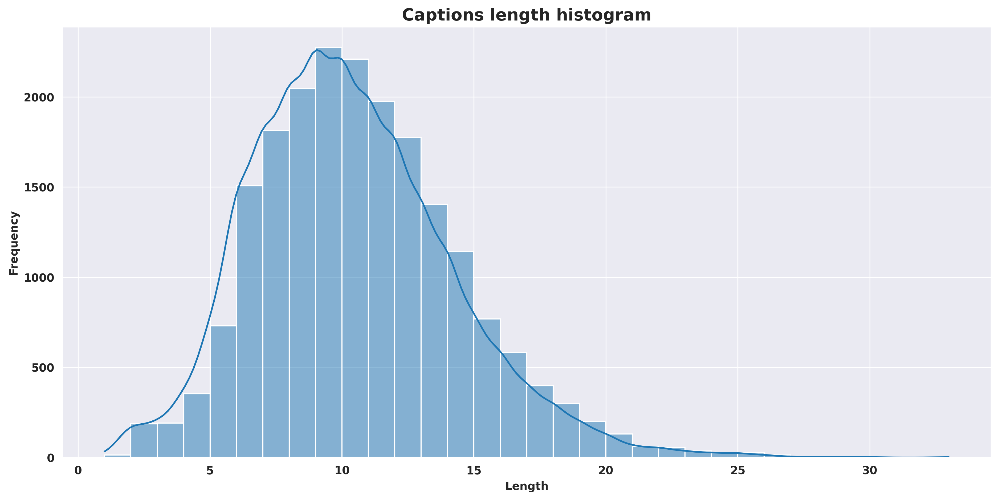

In [24]:
# Function to plot the length distribution of cleaned captions

def captions_length(data):
    plt.figure(figsize=(15, 7), dpi=300)
    sns.set_style('darkgrid')
    # Compute the length (in words) for each caption
    caption_lengths = [len(x.split(' ')) for x in data]
    sns.histplot(x=caption_lengths, kde=True, binwidth=1)
    plt.title('Captions length histogram', fontsize=15, fontweight='bold')
    plt.xticks(fontweight='bold')
    plt.yticks(fontweight='bold')
    plt.xlabel('Length', fontweight='bold')
    plt.ylabel('Frequency', fontweight='bold')
    plt.show()

# Visualize the length distribution for cleaned captions
captions_length(cleaned_captions)


Tokenizing the vocabulary

In [25]:
# Use Keras Tokenizer to convert cleaned captions to integer sequences

# Fit the tokenizer on the cleaned captions
tokenizer = tokenize_captions(cleaned_captions)

# Calculate the vocabulary size (number of unique words + 1 for padding)
vocab_size = len(tokenizer.word_index) + 1

print("Vocabulary size:", vocab_size)


Vocabulary size: 6222


 Splitting the data into train, validation and test sets

In [26]:
# List the image IDs you're using (already filtered to half dataset)
all_image_ids = half_image_ids  # Already selected in cell 2

# Split the image IDs into train, val, and test sets
train_image_ids, val_image_ids = train_test_split(all_image_ids, test_size=0.15, random_state=42)
val_image_ids, test_image_ids = train_test_split(val_image_ids, test_size=0.1, random_state=42)

# Split the captions based on the image ID assignment
train_captions, val_captions, test_captions = [], [], []
for caption in captions_IDs:
    image_id, _ = caption.split('\t')
    if image_id in train_image_ids:
        train_captions.append(caption)
    elif image_id in val_image_ids:
        val_captions.append(caption)
    elif image_id in test_image_ids:
        test_captions.append(caption)
    else:
        print('Unknown image ID!')

# Show a sample caption and number of images in each split
print(train_captions[0], val_captions[0], test_captions[0])
print(
    "Train count:", len(train_captions) // 5,
    "Val count:", len(val_captions) // 5,
    "Test count:", len(test_captions) // 5
)


1001773457_577c3a7d70.jpg	start a black dog and a spotted dog are fighting end
 101669240_b2d3e7f17b.jpg	start a man in a hat is displaying pictures next to a skier in a blue hat end
 1131800850_89c7ffd477.jpg	start a brown and white dog stands outside while it snows end

Train count: 3438 Val count: 546 Test count: 61


Extract the feature vector from all images

In [27]:
# Functions for preprocessing and feature extraction

def preprocess_image(image_path):
    img = load_img(image_path, target_size=(299, 299))  # InceptionV3 expected input size
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img

def extract_image_features(model, image_path):
    img = preprocess_image(image_path)
    features = model.predict(img, verbose=0)  # shape (1, 2048)
    return features

# Load pretrained InceptionV3, remove the last classification layer to get features
inception_v3_model = InceptionV3(weights='imagenet', input_shape=(299, 299, 3))
inception_v3_model.layers.pop()
inception_v3_model = Model(inputs=inception_v3_model.inputs, outputs=inception_v3_model.layers[-2].output)


Extracting Image Features for Training, Validation and Testing

In [28]:
# Dictionaries to store feature vectors per image ID
train_image_features, val_image_features, test_image_features = {}, {}, {}

from tqdm import tqdm_notebook

# Combine all image IDs for fast lookup in one pass
all_ids = set(train_image_ids + val_image_ids + test_image_ids)

pbar = tqdm_notebook(total=len(all_ids), position=0, leave=True, colour='green')

for image_id in all_ids:
    image_path = os.path.join(images_directory, image_id)
    image_features = extract_image_features(inception_v3_model, image_path)
    if image_id in train_image_ids:
        train_image_features[image_id] = image_features.flatten()
    elif image_id in val_image_ids:
        val_image_features[image_id] = image_features.flatten()
    elif image_id in test_image_ids:
        test_image_features[image_id] = image_features.flatten()
    else:
        print('Unknown image ID!')
    pbar.update(1)

pbar.close()

print(
    "Train features:", len(train_image_features),
    "Val features:", len(val_image_features),
    "Test features:", len(test_image_features)
)


  0%|          | 0/4045 [00:00<?, ?it/s]

Train features: 3438 Val features: 546 Test features: 61


 Creating a Data Generator for Model Training

In [40]:
def data_generator(captions, image_features, tokenizer, max_caption_length, batch_size):
    num_samples = len(captions)
    image_ids = list(image_features.keys())
    while True:
        np.random.shuffle(image_ids)  # Shuffle image_ids for each epoch
        for start_idx in range(0, num_samples, batch_size):
            end_idx = min(start_idx + batch_size, num_samples)
            X_images, X_captions, y = [], [], []
            for caption in captions[start_idx:end_idx]:
                image_id, caption_text = caption.split('\t')
                caption_text = caption_text.rstrip('\n')
                seq = tokenizer.texts_to_sequences([caption_text])[0]  # Tokenize caption
                for i in range(1, len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    # FIX: pad with 'post' so all padding is to the right
                    in_seq = pad_sequences([in_seq], maxlen=max_caption_length, padding='post')[0]
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    X_images.append(image_features[image_id])
                    X_captions.append(in_seq)
                    y.append(out_seq)
            # Must yield tuples, not lists!
            yield (np.array(X_images), np.array(X_captions)), np.array(y)


In [41]:
max_caption_length = max(len(caption.split()) for caption in cleaned_captions) + 1
cnn_output_dim = inception_v3_model.output_shape[1]  # should be 2048
batch_size_train = 128  # Start with 128, reduce if RAM problems
batch_size_val = 64

train_data_generator = data_generator(train_captions, train_image_features, tokenizer, max_caption_length, batch_size_train)
val_data_generator = data_generator(val_captions, val_image_features, tokenizer, max_caption_length, batch_size_val)

print("Train generator and validation generator created.")

Train generator and validation generator created.


Building the Image Captioning Model

In [42]:
# Build the Image Captioning model using Keras Functional API

def build_model(vocab_size, max_caption_length, cnn_output_dim):
    # Image features input branch
    input_image = Input(shape=(cnn_output_dim,), name='Features_Input')
    fe1 = BatchNormalization()(input_image)
    fe2 = Dense(256, activation='relu')(fe1)
    fe3 = BatchNormalization()(fe2)

    # Caption sequence branch
    input_caption = Input(shape=(max_caption_length,), name='Sequence_Input')
    se1 = Embedding(vocab_size, 256, mask_zero=True)(input_caption)
    se2 = LSTM(256)(se1)

    # Merge branches
    decoder1 = add([fe3, se2])
    decoder2 = Dense(256, activation='relu')(decoder1)
    outputs = Dense(vocab_size, activation='softmax', name='Output_Layer')(decoder2)

    # Create model
    model = Model(inputs=[input_image, input_caption], outputs=outputs, name='Image_Captioning')
    return model

caption_model = build_model(vocab_size, max_caption_length, cnn_output_dim)

# Compile the model
optimizer = Adam(learning_rate=0.01, clipnorm=1.0)
caption_model.compile(loss='categorical_crossentropy', optimizer=optimizer)

# Show model summary
caption_model.summary()


Model: "Image_Captioning"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Features_Input      │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2048)      │      8,192 │ Features_Input[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Sequence_Input      │ (None, 34)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 256)       │    524,544 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_2         │ (None, 34, 256)   │  1,592,832 │ Sequence_Input[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_2         │ (None, 34)        │          0 │ Sequence_Input[0… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_4[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 256)       │    525,312 │ embedding_2[0][0… │
│                     │                   │            │ not_equal_2[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 256)       │          0 │ batch_normalizat… │
│                     │                   │            │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 256)       │     65,792 │ add_2[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Output_Layer        │ (None, 6222)      │  1,599,054 │ dense_5[0][0]     │
│ (Dense)             │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,316,750 (16.47 MB)

 Trainable params: 4,312,142 (16.45 MB)

 Non-trainable params: 4,608 (18.00 KB)

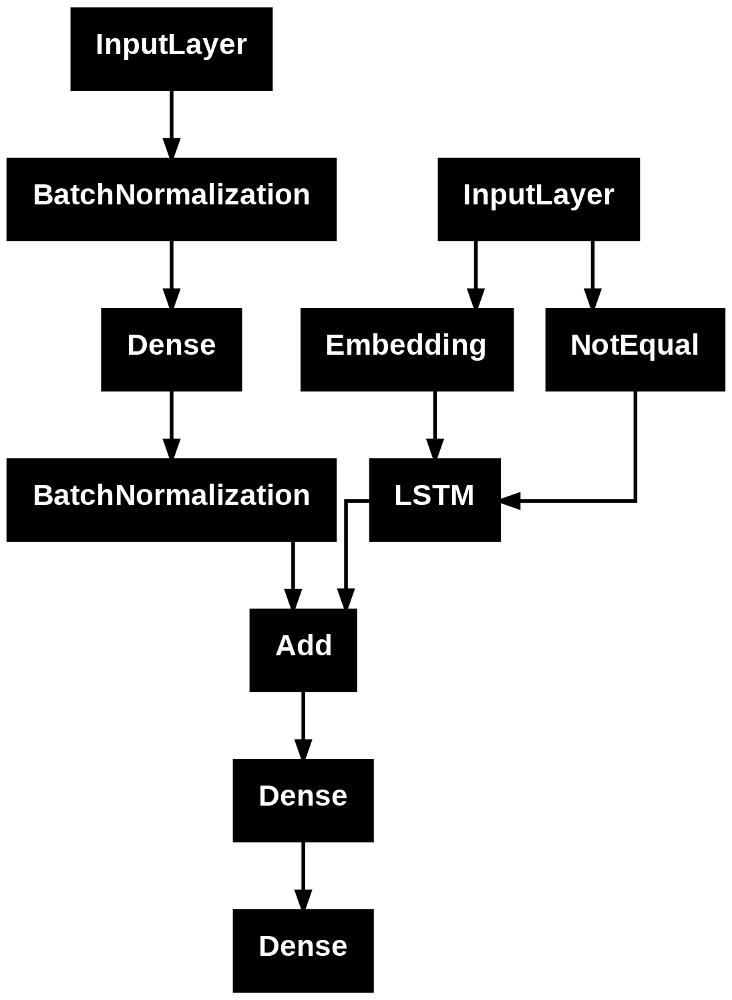

In [43]:
plot_model(caption_model)

Training the Model with Early Stopping and Learning Rate Scheduling

In [44]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler

# Early Stopping configuration
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Learning Rate Scheduler that returns a float
def lr_scheduler(epoch, lr):
    return float(lr * np.exp(-0.6))

lr_schedule = LearningRateScheduler(lr_scheduler)

# Specify the output signature to match the generator's output structure
output_signature = (
    (
        tf.TensorSpec(shape=(None, cnn_output_dim), dtype=tf.float32),    # Image feature vector
        tf.TensorSpec(shape=(None, max_caption_length), dtype=tf.int32)   # Caption sequence
    ),
    tf.TensorSpec(shape=(None, vocab_size), dtype=tf.float32)             # Target sequence (one-hot)
)

# Convert generators to tf.data.Dataset for Keras compatibility
train_dataset = tf.data.Dataset.from_generator(
    lambda: data_generator(train_captions, train_image_features, tokenizer, max_caption_length, batch_size_train),
    output_signature=output_signature
)

val_dataset = tf.data.Dataset.from_generator(
    lambda: data_generator(val_captions, val_image_features, tokenizer, max_caption_length, batch_size_val),
    output_signature=output_signature
)

# Train for just 1 epoch for debugging/stability
history = caption_model.fit(
    train_dataset,
    steps_per_epoch=len(train_captions) // batch_size_train,
    validation_data=val_dataset,
    validation_steps=len(val_captions) // batch_size_val,
    epochs=1,
    callbacks=[early_stopping, lr_schedule]
)


134/134 ━━━━━━━━━━━━━━━━━━━━ 28s 180ms/step - loss: 5.3137 - val_loss: 3.9515 - learning_rate: 0.0055


In [45]:
history = caption_model.fit(
    train_dataset,
    steps_per_epoch=len(train_captions) // batch_size_train,
    validation_data=val_dataset,
    validation_steps=len(val_captions) // batch_size_val,
    epochs=5,
    callbacks=[early_stopping, lr_schedule]
)


Epoch 1/5
134/134 ━━━━━━━━━━━━━━━━━━━━ 25s 188ms/step - loss: 3.5595 - val_loss: 3.6332 - learning_rate: 0.0030
Epoch 2/5
134/134 ━━━━━━━━━━━━━━━━━━━━ 23s 176ms/step - loss: 3.1194 - val_loss: 3.5477 - learning_rate: 0.0017
Epoch 3/5
134/134 ━━━━━━━━━━━━━━━━━━━━ 25s 185ms/step - loss: 2.8650 - val_loss: 3.5222 - learning_rate: 9.0718e-04
Epoch 4/5
134/134 ━━━━━━━━━━━━━━━━━━━━ 25s 185ms/step - loss: 2.7117 - val_loss: 3.5207 - learning_rate: 4.9787e-04
Epoch 5/5
134/134 ━━━━━━━━━━━━━━━━━━━━ 24s 180ms/step - loss: 2.6127 - val_loss: 3.5232 - learning_rate: 2.7324e-04


Visualizing Training and Validation Loss

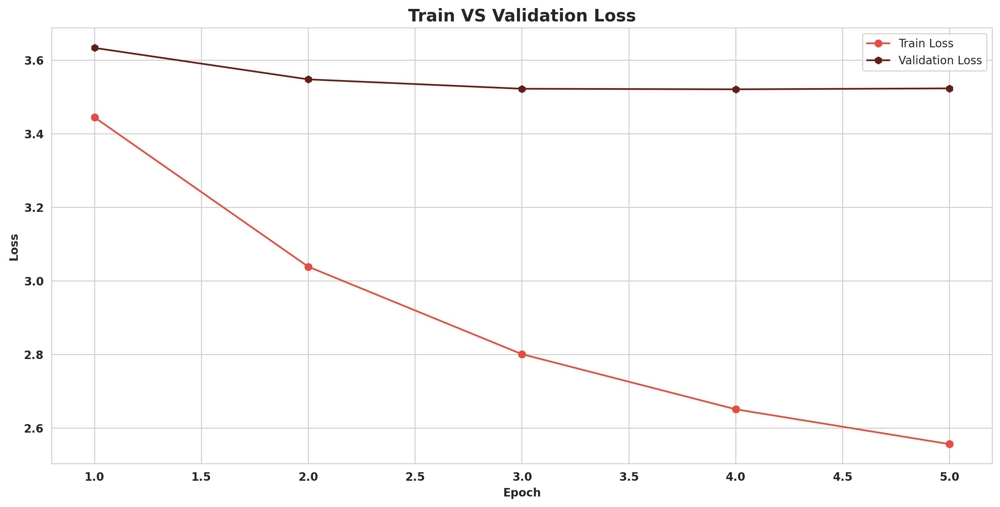

In [46]:
# Plot training vs validation loss

plt.figure(figsize=(15, 7), dpi=200)
sns.set_style('whitegrid')

# Plot each epoch loss
plt.plot([x+1 for x in range(len(history.history['loss']))], history.history['loss'], color='#E74C3C', marker='o')
plt.plot([x+1 for x in range(len(history.history['val_loss']))], history.history['val_loss'], color='#641E16', marker='h')

plt.title('Train VS Validation Loss', fontsize=15, fontweight='bold')
plt.xticks(fontweight='bold')
plt.yticks(fontweight='bold')
plt.xlabel('Epoch', fontweight='bold')
plt.ylabel('Loss', fontweight='bold')
plt.legend(['Train Loss', 'Validation Loss'], loc='best')
plt.show()


Generating Captions Using Greedy Search

In [47]:
# Generate a caption for a single image feature vector using greedy search

def greedy_generator(image_features):
    in_text = 'start '
    for _ in range(max_caption_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_caption_length, padding='post').reshape((1, max_caption_length))
        prediction = caption_model.predict([image_features.reshape(1, cnn_output_dim), sequence], verbose=0)
        idx = np.argmax(prediction)
        word = tokenizer.index_word.get(idx, '')
        in_text += ' ' + word
        if word == 'end' or word == '':
            break
    in_text = in_text.replace('start ', '').replace(' end', '').strip()
    return in_text

# Example (for one image id in test set):
test_id = list(test_image_features.keys())[0]
print("Sample generated caption:", greedy_generator(test_image_features[test_id]))


Sample generated caption: a white bird is flying out of water


Generating Captions Using Beam Search

In [48]:
# Generate a caption for a single image feature vector using beam search

def beam_search_generator(image_features, K_beams=3, log=False):
    start_seq = [tokenizer.word_index['start']]
    start_word = [[start_seq, 0.0]]  # (partial sequence, cumulative score)

    for _ in range(max_caption_length):
        temp = []
        for s in start_word:
            sequence = pad_sequences([s[0]], maxlen=max_caption_length, padding='post').reshape((1, max_caption_length))
            preds = caption_model.predict([image_features.reshape(1, cnn_output_dim), sequence], verbose=0)
            word_preds = np.argsort(preds[0])[-K_beams:]  # Get top K words (by index)
            for w in word_preds:
                next_cap, prob = list(s[0]), s[1]
                next_cap.append(w)
                if log:
                    prob += np.log(preds[0][w])  # sum log probs if log=True
                else:
                    prob += preds[0][w]          # sum probs
                temp.append([next_cap, prob])
        # Keep top K overall
        start_word = sorted(temp, reverse=False, key=lambda l: l[1])
        start_word = start_word[-K_beams:]

    # Build final caption (by best scoring sequence)
    best_seq = start_word[-1][0]
    captions_ = [tokenizer.index_word.get(i, '') for i in best_seq]

    final_caption = []
    for word in captions_:
        if word == 'end':
            break
        if word != 'start' and word != '':
            final_caption.append(word)
    return ' '.join(final_caption)

# Example (for one image id in test set):
test_id = list(test_image_features.keys())[0]
print("Sample BEAM search caption:", beam_search_generator(test_image_features[test_id]))


Sample BEAM search caption: a white bird flies out of water


BLEU Score

In [49]:
from nltk.translate.bleu_score import corpus_bleu

def BLEU_score(actual, greedy, beam_search):
    # These are lists of references and lists of candidates as required by corpus_bleu
    score_greedy_1 = corpus_bleu(actual, greedy, weights=(0.3, 0.3, 0.3, 0))
    score_greedy_2 = corpus_bleu(actual, greedy, weights=(0.25, 0.25, 0.25, 0.25))
    score_BS_1 = corpus_bleu(actual, beam_search, weights=(0.3, 0.3, 0.3, 0))
    score_BS_2 = corpus_bleu(actual, beam_search, weights=(0.25, 0.25, 0.25, 0.25))

    return [
        f'BLEU-2 Greedy: {round(score_BS_2, 5)}',
        f'BLEU-1 Greedy: {round(score_BS_1, 5)}',
        f'Greedy: {greedy[0]}',
        f'BLEU-2 Beam Search: {round(score_greedy_2, 5)}',
        f'BLEU-1 Beam Search: {round(score_greedy_1, 5)}',
        f'Beam Search: {beam_search[0]}'
    ]

Generating Captions for Test Images

In [50]:
# Generate captions for all test images using greedy search

generated_captions = {}

from tqdm import tqdm_notebook

pbar = tqdm_notebook(total=len(test_image_features), position=0, leave=True, colour='green')
for image_id in test_image_features:
    cap = greedy_generator(test_image_features[image_id])
    generated_captions[image_id] = cap
    pbar.update(1)
pbar.close()

# Display a sample result
example_id = list(generated_captions.keys())[0]
print(f"Test image: {example_id}, Generated caption: {generated_captions[example_id]}")


  0%|          | 0/61 [00:00<?, ?it/s]

Test image: 3210457502_c6030ce567.jpg, Generated caption: a white bird is flying out of water


 Visualizing Caption Generation Results

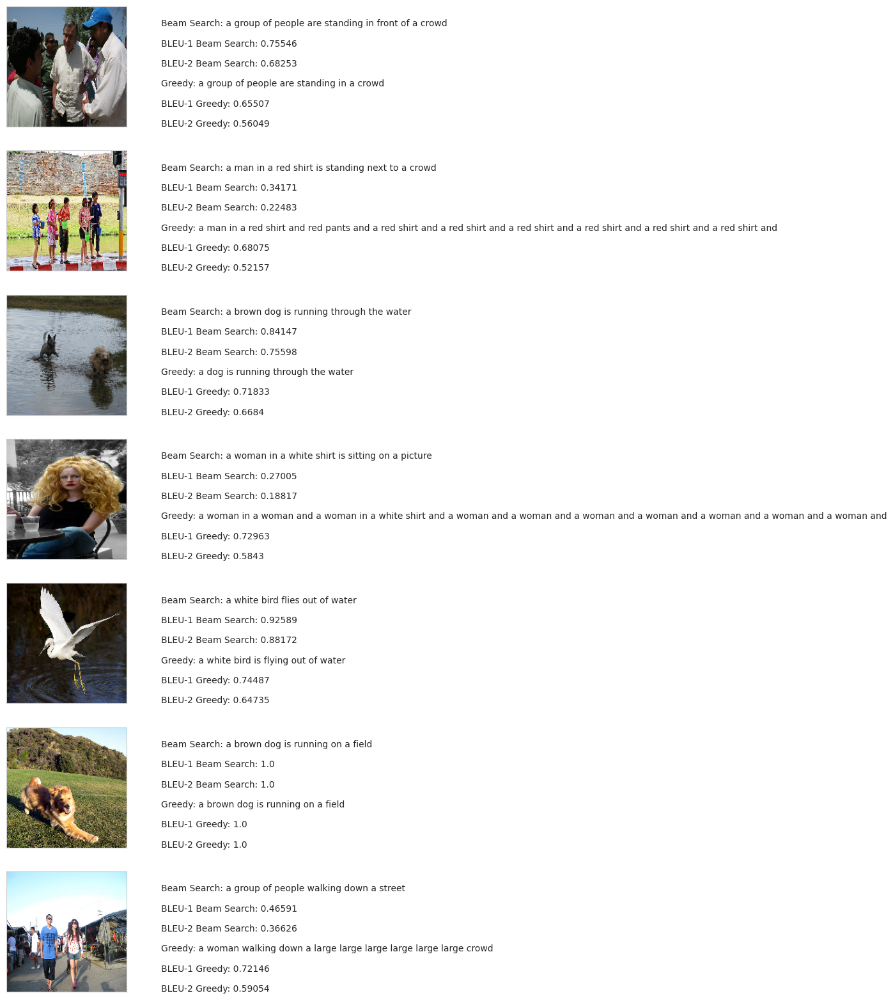

In [52]:
# Visualization of captions: show random test images with actual and generated captions + BLEU

def visualization(test_actual_captions, greedy_caps, beamS_generator, evaluator, num_of_images):
    import numpy as np
    keys = list(test_actual_captions.keys())
    images = [np.random.choice(keys) for _ in range(num_of_images)]  # Randomly select image IDs

    count = 1
    fig = plt.figure(figsize=(6, 20))
    for filename in images:
        actual_cap = test_actual_captions[filename]
        # Clean up actual captions
        actual_cap = [x.replace("start ", "") for x in actual_cap]
        actual_cap = [x.replace(" end", "") for x in actual_cap]

        # Generate captions
        greedy_cap = greedy_caps[filename]
        beamS_cap = beamS_generator(test_image_features[filename])

        # BLEU evaluation
        caps_with_score = evaluator([actual_cap], [greedy_cap], [beamS_cap])

        # Show the image
        image_load = load_img(images_directory + filename, target_size=(199, 199, 3))
        ax = fig.add_subplot(num_of_images, 2, count, xticks=[], yticks=[])
        ax.imshow(image_load)
        count += 1

        # Show the captions and BLEU scores
        ax = fig.add_subplot(num_of_images, 2, count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0, 1)
        ax.set_ylim(0, len(caps_with_score))
        for i, text in enumerate(caps_with_score):
            ax.text(0, i, text, fontsize=10)
        count += 1
    plt.show()

# You must prepare test_actual_captions as a dict: image_id -> list of its valid actual captions
# Example (if you filtered captions for test images):
test_actual_captions = {}
for caption in test_captions:
    image_id, caption_text = caption.split('\t')
    caption_text = caption_text.replace('start ', '').replace(' end', '').strip()
    if image_id not in test_actual_captions:
        test_actual_captions[image_id] = []
    test_actual_captions[image_id].append(caption_text)

# Visualize 7 test images with results and scores
visualization(test_actual_captions, generated_captions, beam_search_generator, BLEU_score, 7)


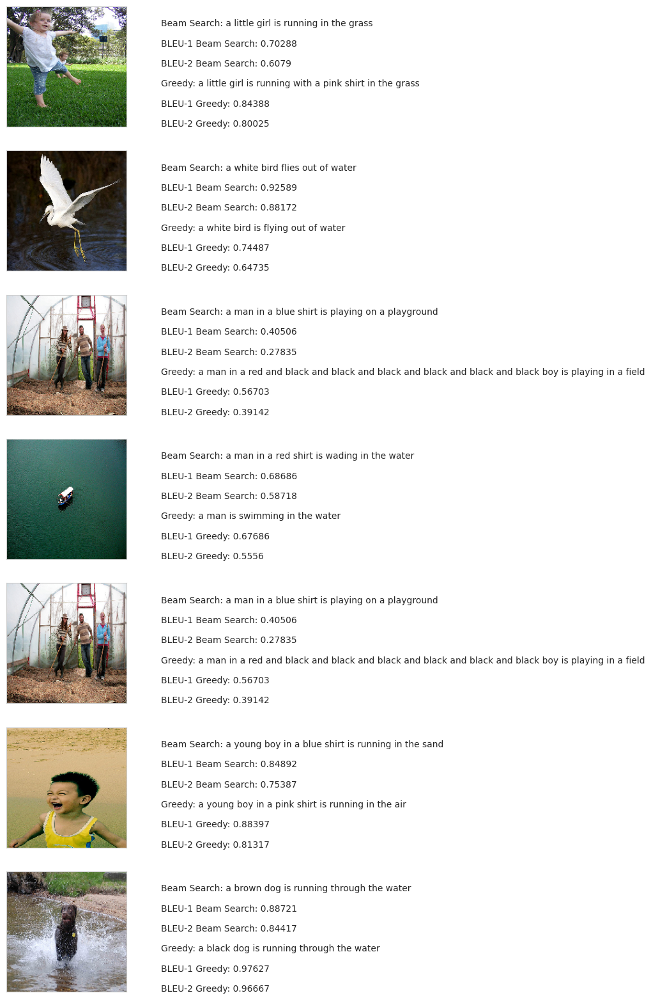

In [53]:
# Visualization of captions: show random test images with actual and generated captions + BLEU

def visualization(test_actual_captions, greedy_caps, beamS_generator, evaluator, num_of_images):
    import numpy as np
    keys = list(test_actual_captions.keys())
    images = [np.random.choice(keys) for _ in range(num_of_images)]  # Randomly select image IDs

    count = 1
    fig = plt.figure(figsize=(6, 20))
    for filename in images:
        actual_cap = test_actual_captions[filename]
        # Clean up actual captions
        actual_cap = [x.replace("start ", "") for x in actual_cap]
        actual_cap = [x.replace(" end", "") for x in actual_cap]

        # Generate captions
        greedy_cap = greedy_caps[filename]
        beamS_cap = beamS_generator(test_image_features[filename])

        # BLEU evaluation
        caps_with_score = evaluator([actual_cap], [greedy_cap], [beamS_cap])

        # Show the image
        image_load = load_img(images_directory + filename, target_size=(199, 199, 3))
        ax = fig.add_subplot(num_of_images, 2, count, xticks=[], yticks=[])
        ax.imshow(image_load)
        count += 1

        # Show the captions and BLEU scores
        ax = fig.add_subplot(num_of_images, 2, count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0, 1)
        ax.set_ylim(0, len(caps_with_score))
        for i, text in enumerate(caps_with_score):
            ax.text(0, i, text, fontsize=10)
        count += 1
    plt.show()

# You must prepare test_actual_captions as a dict: image_id -> list of its valid actual captions
# Example (if you filtered captions for test images):
test_actual_captions = {}
for caption in test_captions:
    image_id, caption_text = caption.split('\t')
    caption_text = caption_text.replace('start ', '').replace(' end', '').strip()
    if image_id not in test_actual_captions:
        test_actual_captions[image_id] = []
    test_actual_captions[image_id].append(caption_text)

# Visualize 7 test images with results and scores
visualization(test_actual_captions, generated_captions, beam_search_generator, BLEU_score, 7)
